# <목차>

### - 탐색적 데이터 분석 (EDA)

   - [라이브러리 모음](#라이브러리-모음)
   
   - [전체 DATA 요약 분석](#<전체-Data-간단-요약>) 
    - [train.csv Data 요약 내용](#<train.csv-Data-요약-내용>)
    - [이미지 파일 경로 추출](#<이미지-파일-경로-추출>)
    - [train data 중 각 Column 별 Unique 개수](#<train-data-중-각-Column-별-Unique-개수>)
    
   - [이미지 DATA 분석](#이미지-DATA-분석)
    - [랜덤으로 Image 출력 함수 생성 및 Image 출력](#<랜덤으로-Image-출력-함수-생성-및-Image-출력>)
    - [이미지와 label_group 연결한 DATA 시각화](#<이미지와-label_group-연결한-DATA-시각화>)
    
   - [이미지 해시(phash) DATA 분석](#이미지-해시(phash)-DATA-분석)
    - [한 이미지의 해시 matrix](#<한-이미지의-해시-matrix>)
    - [해시 matrix 비교 함수](#<해시-matrix-비교-함수>)
    - [10개 phash값 비교 matrix](#<10개-phash값-비교-matrix>)
    - [1000개 이미지 중 똑같은 이미지가 3개 이상인 index 추출](#<1000개-이미지-중-똑같은-이미지가-3개-이상인-index-추출>)
    - [5000개 이미지 중 phash 값의 차이가 5 이하인 값 찾기](#Test-==>-5000개-이미지-중-phash-값의-차이가-5-이하인-값-찾기)
    
   - [Text Data 분석](#Text-Data)
    - [Title Text Raw Data TFIDF 처리](#<TFIDF-Text-처리>)
    - [Title Text KNN 적용 후 근접 이웃 Data 확인](#<가장-근접한-2개의-이웃-data의-거리와-그-data가-동일상품인지-label_group-확인>)
    - [Title Text 전처리 함수](#<Title-Text-전처리-함수>)
    - [Clean_Title Data 생성](#<Clean_Title-관련-data-생성>)
    - [Clean Title Text Data Histogram 확인](#<각-Data-histogram-확인>)
    - [Clean Title Text KNN 적용 후 이웃 Data 확인](#<전처리-된-Clean-Title-Text로-KNN-적용>)
    - [Title Text EDA 중간 Feedback](#<Title-Text-EDA-중간-Feedback>)

# 라이브러리 모음

In [42]:
# 파일 처리
import os

# Data 처리
import pandas as pd
import numpy as np

# ML, DNN, CNN 관련 라이브러리
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Layer, Input, GlobalAveragePooling2D, Softmax

import efficientnet.tfkeras as efn
from sklearn.neighbors import NearestNeighbors
import math
##############################################################

# 이미지 및 그래프 출력
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

##############################################################

# 해쉬(phash) 값 처리
import imagehash

##############################################################

# Text Data NLP 처리
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.neighbors import NearestNeighbors
import re
import nltk
nltk.download('popular')

##############################################################

# 메모리 관리
import gc

# 경고메시지 지우기
import warnings
warnings.filterwarnings(action='ignore')

# 상태바 진행상태
from tqdm import tqdm

# Text Color
from termcolor import colored


# 전체 Data 간단 요약

In [2]:
# 전체 Data 요약

BASE_DIR = './shopee-product-matching/'

# CSV 파일
train_df = pd.read_csv(BASE_DIR + 'train.csv')
test_df = pd.read_csv(BASE_DIR + 'test.csv')
sample_df = pd.read_csv(BASE_DIR + 'sample_submission.csv')

### 공통 변수 모음

In [26]:
IMG_SIZE = [512, 512]

BATCH_SIZE = 10

N_CLASSES = len(train_df['label_group'].unique()) # 11011

### <train.csv 상위 5 row data>

In [12]:
train_df.head()

,posting_id,image,image_phash,title,label_group
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069


### <test.csv 상위 3 row data>

In [13]:
test_df.head()

,posting_id,image,image_phash,title
0,test_2255846744,0006c8e5462ae52167402bac1c2e916e.jpg,ecc292392dc7687a,Edufuntoys - CHARACTER PHONE ada lampu dan mus...
1,test_3588702337,0007585c4d0f932859339129f709bfdc.jpg,e9968f60d2699e2c,(Beli 1 Free Spatula) Masker Komedo | Blackhea...
2,test_4015706929,0008377d3662e83ef44e1881af38b879.jpg,ba81c17e3581cabe,READY Lemonilo Mie instant sehat kuah dan goreng


### <sample_submission.csv 상위 3 row data>

In [14]:
sample_df.head()

,posting_id,matches
0,test_2255846744,test_2255846744
1,test_3588702337,test_3588702337
2,test_4015706929,test_4015706929


## <train.csv Data 요약 내용>

In [14]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34250 entries, 0 to 34249
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   posting_id   34250 non-null  object
 1   image        34250 non-null  object
 2   image_phash  34250 non-null  object
 3   title        34250 non-null  object
 4   label_group  34250 non-null  int64 
dtypes: int64(1), object(4)
memory usage: 1.3+ MB


## ------------------------------------------------
### posting_id      :  각 이미지의 고유한 key 값
### image              :  상품 이미지 파일 이름
### posting_id      :  상품 이미지 해쉬 data
### image_phash :  포스팅 상품 제목 제목 
### label_group    :  동일 상품 분류 코드
## ------------------------------------------------

## <이미지 파일 경로 추출>

In [23]:
# Image 파일 위치

train_image_dir = './shopee-product-matching/train_images'
test_image_dir = './shopee-product-matching/test_images'


# 각 Image 파일 경로 추출
def getImagePath(path):
    
    IMG_PATH = []
    for filenm in os.listdir(path):
        img_path = os.path.join(path, filenm)
        IMG_PATH.append(img_path)
        
    return IMG_PATH

train_image_path = getImagePath(train_image_dir)
test_image_path = getImagePath(test_image_dir)

print('train image 개수 :', colored(len(train_image_path), 'red'))
print('test image 개수 :', colored(len(test_image_path), 'red'))

train image 개수 : 32412
test image 개수 : 3


## <train data 중 각 Column 별 Unique 개수>

In [23]:
for col in train_df.columns:
    print('{} : {}'.format(col, colored(len(train_df[col].unique()), 'blue')))

posting_id : 34250
image : 32412
image_phash : 28735
title : 33117
label_group : 11014


# ####################################

# 이미지 DATA 분석

# ####################################

## <랜덤으로 Image 출력 함수 생성 및 Image 출력>

In [77]:
# 랜덤으로 Image 출력 함수

def displayIMG(df, rows, cols, path, random):
    for row in range(rows):
        plt.figure(figsize=(20,5))
        
        for col in range(cols):
            if random :
                r = np.random.randint(0, len(df))
            else:
                r = cols*row + col
            
            img_name = df.iloc[r, 1]
            title = df.iloc[r, 3]
            
            title_with_return = ""
            for idx,word in enumerate(title):
                title_with_return += word
                if (idx!=0)&(idx%20==0): title_with_return += '\n'
            
            img_path = os.path.join(path, img_name)
            image = cv2.imread(img_path)
            
            plt.subplot(1, cols, col+1)
            plt.title(title_with_return)
            plt.axis('off')
            plt.imshow(image)
            
        plt.show()
        

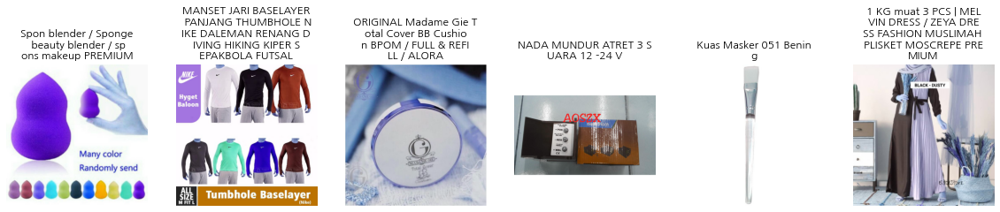

  3%|▎         | 1079/34250 [54:46<28:03:57,  3.05s/it]


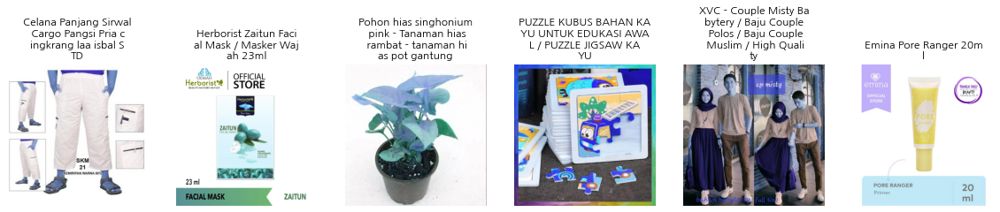

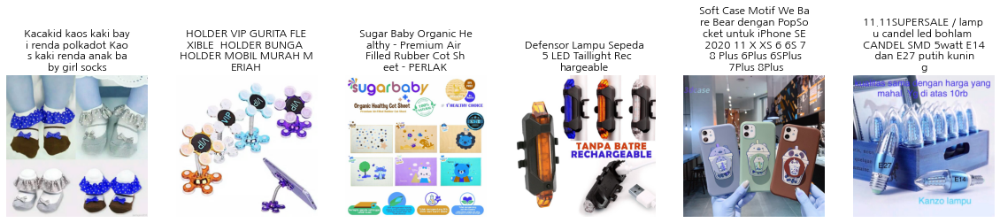

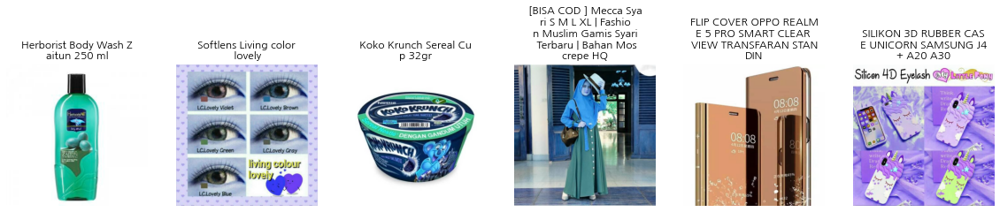

In [78]:
# Train Image
train_image_dir = './shopee-product-matching/train_images'
displayIMG(train_df, 4,6,train_image_dir, True)

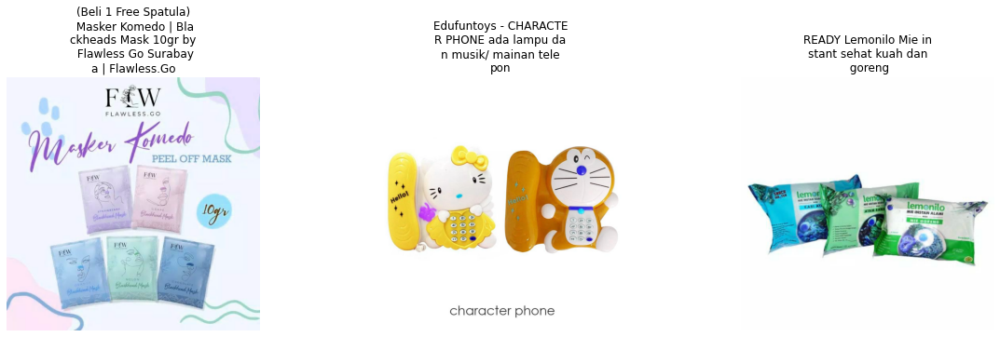

In [30]:
# Test Image
test_image_dir = './shopee-product-matching/test_images'
displayIMG(test_df, 1,3,test_image_dir)

# <이미지와 label_group 연결한 DATA 시각화>

In [4]:
# label_group Data 요약

group = train_df.label_group.value_counts()
print(group)

994676122     51
159351600     51
562358068     51
3113678103    51
1163569239    51
              ..
3996065489     2
517023446      2
2101581536     2
3460538113     2
3927456083     2
Name: label_group, Length: 11014, dtype: int64


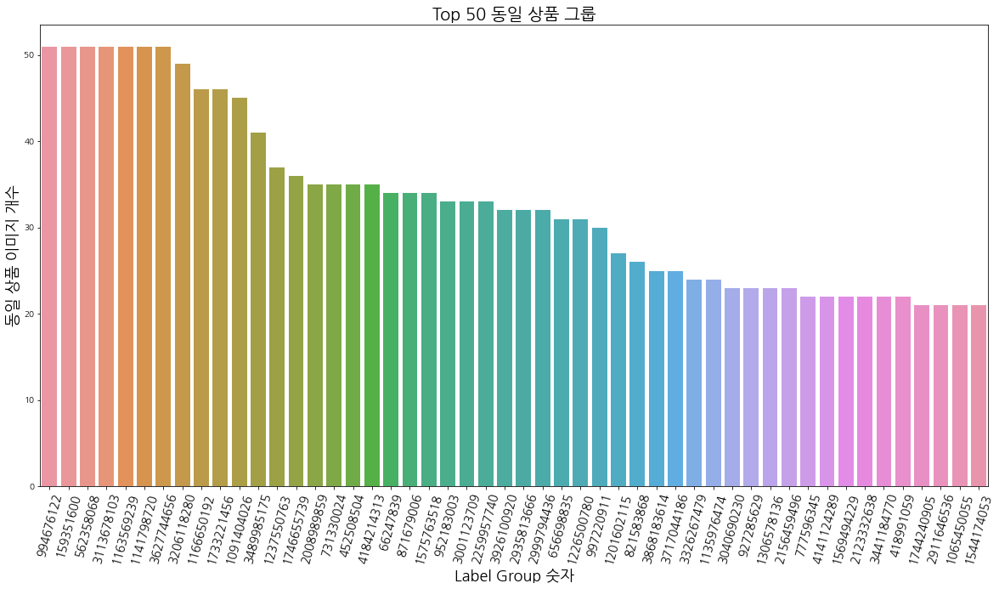

In [9]:
# Top 50 동일상품 개수 막대 그래프

plt.figure(figsize=(20,10))
sns.barplot(group.index.values[:50].astype('str'), group.values[:50])
plt.xticks(rotation=75, size=14)
plt.rc('font', family='NanumGothic')
plt.ylabel('동일 상품 이미지 개수', size=18)
plt.xlabel('Label Group 숫자', size=18)
plt.title('Top 50 동일 상품 그룹', size=20)
plt.show()

########################################
## Top1 동일 상품 label_group : 994676122
########################################


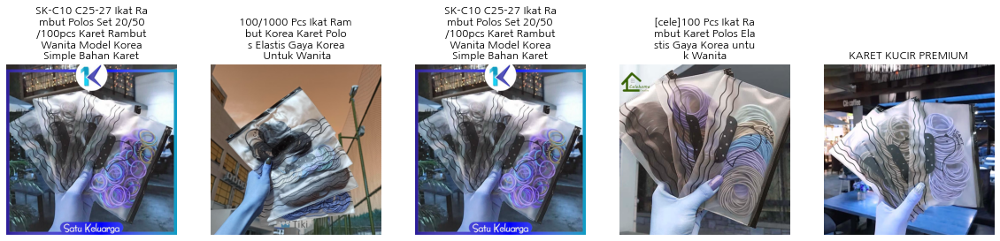

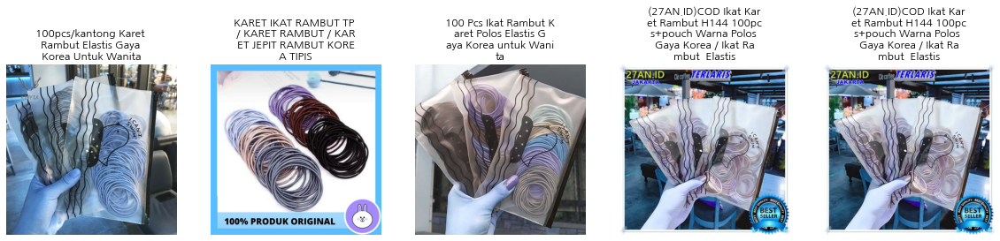

########################################
## Top2 동일 상품 label_group : 159351600
########################################


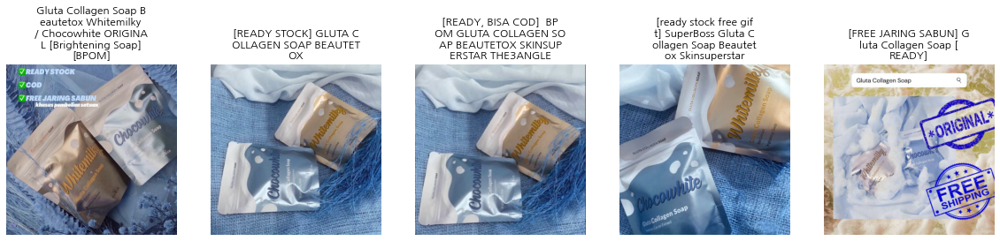

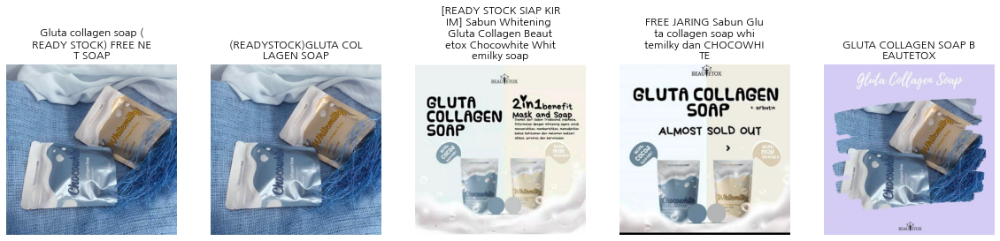

########################################
## Top3 동일 상품 label_group : 562358068
########################################


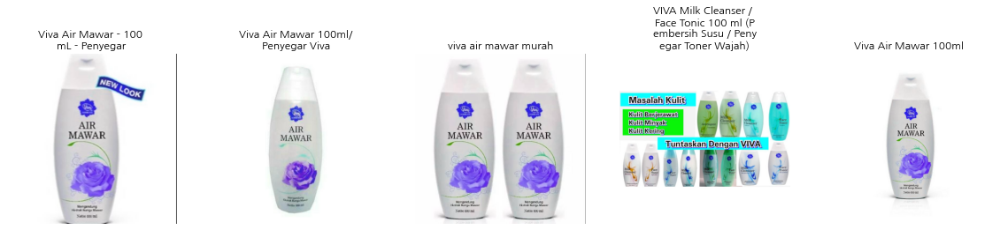

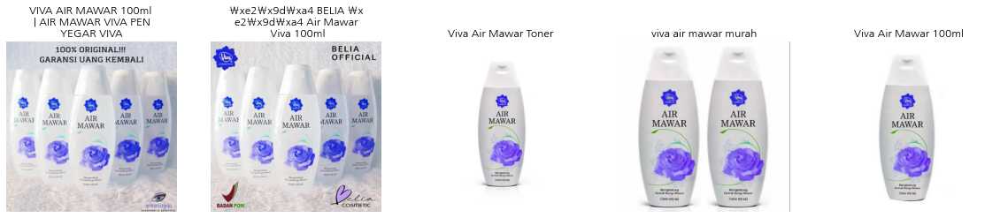

########################################
## Top4 동일 상품 label_group : 3113678103
########################################


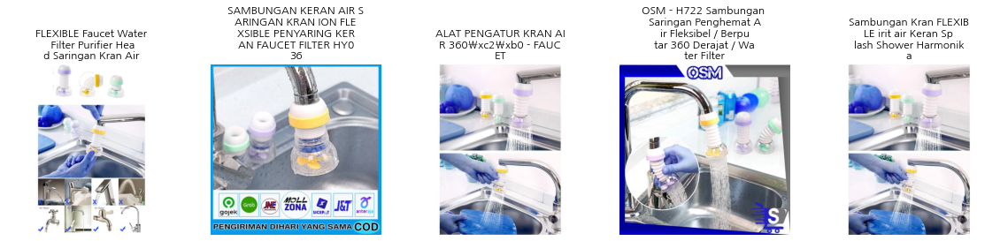

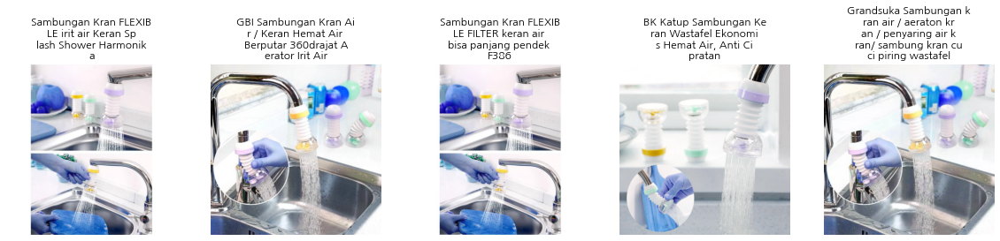

########################################
## Top5 동일 상품 label_group : 1163569239
########################################


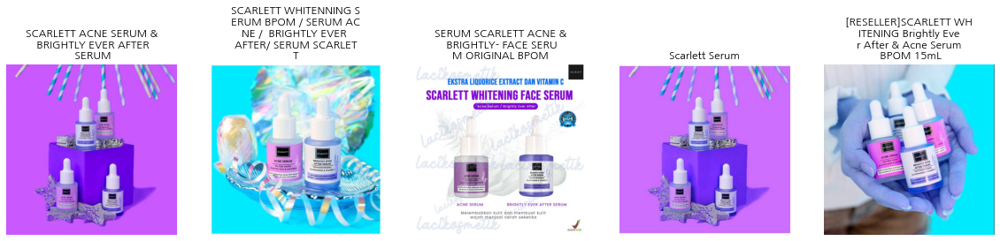

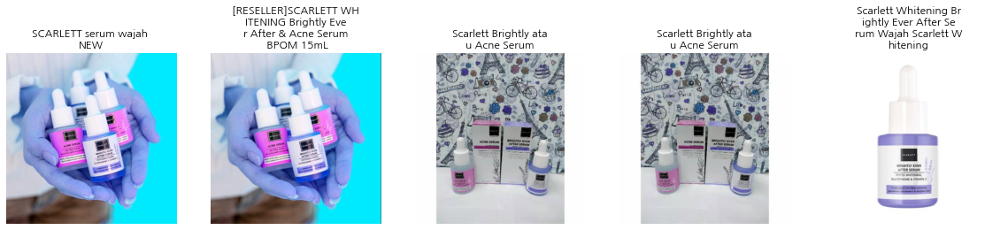

In [56]:
for i in range(5):
    print('#' * 40)
    print('## Top{} 동일 상품 label_group : {}'.format(i+1, group.index[i]))
    print('#' * 40)
    
    image_df = train_df.loc[train_df.label_group == group.index[i]]
    
    displayIMG(image_df, 2,5, train_image_dir)

In [59]:
matches = train_df.groupby(['label_group'])['posting_id'].unique().to_dict()
train_df['matches'] = train_df['label_group'].map(matches)
train_df['matches']

0                      [train_129225211, train_2278313361]
1                     [train_3386243561, train_3423213080]
2                     [train_2288590299, train_3803689425]
3                     [train_2406599165, train_3342059966]
4                      [train_3369186413, train_921438619]
                               ...                        
34245                 [train_2829161572, train_4028265689]
34246                  [train_1463059254, train_769054909]
34247    [train_4126022211, train_3926241003, train_232...
34248    [train_3419392575, train_1431563868, train_363...
34249                  [train_795128312, train_1792180725]
Name: matches, Length: 34250, dtype: object

In [60]:
train_df['matches'] = train_df['matches'].map(lambda x: ' '.join(x))
train_df['matches']

0                         train_129225211 train_2278313361
1                        train_3386243561 train_3423213080
2                        train_2288590299 train_3803689425
3                        train_2406599165 train_3342059966
4                         train_3369186413 train_921438619
                               ...                        
34245                    train_2829161572 train_4028265689
34246                     train_1463059254 train_769054909
34247    train_4126022211 train_3926241003 train_232545...
34248    train_3419392575 train_1431563868 train_363094...
34249                     train_795128312 train_1792180725
Name: matches, Length: 34250, dtype: object

In [72]:
# decode Image dataset
sample_image = train_df['image'][0]
image_path = BASE_DIR + 'train_images/' + sample_image
image = tf.io.read_file(image_path)
image = tf.image.decode_jpeg(image, channels=3)
image = tf.image.resize(image, [224,224])
image = image /255.0
image

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.6121449 , 0.34939978, 0.3846939 ],
        [0.5610844 , 0.2983393 , 0.33363342],
        [0.57603043, 0.31328532, 0.34857944],
        ...,
        [0.55356145, 0.38123214, 0.4292511 ],
        [0.5655062 , 0.3489994 , 0.39295682],
        [0.5711286 , 0.32595018, 0.36758685]],

       [[0.4708283 , 0.20808323, 0.24337734],
        [0.49125654, 0.22851142, 0.26380557],
        [0.5120248 , 0.24927975, 0.28457388],
        ...,
        [0.5295923 , 0.39085656, 0.4459387 ],
        [0.56392556, 0.382693  , 0.44863924],
        [0.576491  , 0.35688257, 0.43363357]],

       [[0.569968  , 0.30722287, 0.342517  ],
        [0.56162465, 0.29887953, 0.33417365],
        [0.57364947, 0.31090435, 0.34619847],
        ...,
        [0.2796543 , 0.22981384, 0.24634065],
        [0.44807985, 0.3502203 , 0.40036047],
        [0.4844156 , 0.35298273, 0.41998956]],

       ...,

       [[0.728592  , 0.5250097 , 0.57571036],
        [0.64

In [56]:
# 이미지 decode 함수
def image_decode(image_path):
    image= tf.io.read_file(image_path)
    image= tf.image.decode_jpeg(image, channels=3)
    image= tf.image.resize(image, IMG_SIZE)
    image= image / 255.0
    return image

In [44]:
# 이미지 Dataset 생성 함수
def get_imgdata(image):
    dataset=tf.data.Dataset.from_tensor_slices(image)
    dataset=dataset.map(image_decode,
                        num_parallel_calls=tf.data.experimental.AUTOTUNE)
    dataset=dataset.batch(BATCH_SIZE)
    dataset=dataset.prefetch(tf.data.experimental.AUTOTUNE)
    return dataset

In [45]:
# F1 Score 함수
def f1_score(t_true, t_pred):
    t_true = t_true.apply(lambda x : set(x.split()))
    t_pred = t_pred.apply(lambda x : set(x.split()))
    
    intersection = np.array([len(x[0] & x[1]) for x in zip(t_true, t_pred)])
    len_t_true = t_true.apply(lambda x : len(x)).values
    len_t_pred = t_pred.apply(lambda x : len(x)).values
    
    F1 = 2 * intersection / (len_t_true + len_t_pred)
    
    return F1

In [52]:
# ArcFace loss 생성 Class
class ArcMarginProduct(Layer):
    '''
    GDis(Geodestic Distance margin) 구하는 Class
    '''
    
    def __init__(self, n_classes, s=30, m=0.5, easy_margin=False, ls_eps=0.0, **kwargs):
        
        super(ArcMarginProduct, self).__init__(**kwargs)
        
        self.n_classes = n_classes
        self.s = s
        self.m = m
        self.ls_eps = ls_eps
        self.easy_margin = easy_margin
        self.cos_m =tf.math.cos(m)
        self.sin_m =tf.math.sin(m)
        self.th = tf.math.cos(math.pi - m)
        self.mm = tf.math.sin(math.pi - m) * m
        
    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'n_classes':self.n_classes,
            's' : self.s,
            'm' : self.m,
            'ls_eps' : self.ls_eps,
            'easy_margin' : self.easy_margin
        })
        return config
    
    def build(self, input_shape):
        super(ArcMarginProduct, self).build(input_shape[0])
        
        self.W = self.add_weight(
            name='W',
            shape=(int(input_shape[0][-1]), self.n_classes),
            initializer = 'glorot_uniform',
            dtype='float32',
            trainable=True,
            regularizer=None
            )
        
    def call(self, inputs):
        X, y = inputs
        y = tf.cast(y, dtype=tf.int32)
        cosine = tf.matmul(
            tf.math.l2_normalize(X, axis=1),
            tf.math.l2_normalize(self.W, axis=0)
        )
        sine = tf.math.sqrt(1.0 - tf.math.pow(cosine, 2))
        phi = cosine * self.cos_m - sine * self.sin_m
        
        if self.easy_margin:
            phi = tf.where(cosine > 0, phi, cosine)
        else:
            phi = tf.where(cosine > self.th, phi, cosine - self.mm)
            
        one_hot = tf.cast(
            tf.one_hot(y, depth=self.n_classes),
            dtype=cosine.dtype
        )
        
        if self.ls_eps > 0:
            one_hot = (1-self.ls_eps) * one_hot + self.ls_eps / self.n_classes
            
        output = (one_hot * phi) + ((1.0 - one_hot) * cosine)
        output *= self.s
        return output

In [54]:
# Image embedding 함수 
def get_image_embeddings(image_path):
    embeds = []
    
    margin = ArcMarginProduct(
             n_classes = 11011,
             s = 30,
             m = 0.5,
             name = 'head/arc_margin',
             dtype = 'float32'
             )
    
    input_layer = Input(shape = (*IMG_SIZE, 3))  # *IMG_SIZE ==> (512, 512) 튜플로 바꿔줌
    label = Input(shape= ())
    x = efn.EfficientNetB3(weights= None, include_top=False)(input_layer)
    x = GlobalAveragePooling2D()(x)
    x = margin([x, label])
    
    output = Softmax(dtype='float32')(x)
    
    model = Model(inputs = [input_layer, label], outputs = [output])
    model.load_weights('./EfficientNetB3_512_42.h5')
    model = Model(inputs = model.input[0], outputs = model.layers[-4].output)
    
    chunk = 5000
    iterator = np.arange(np.ceil(len(train_df) / chunk))
    for i in iterator:
        print('총 {}번 학습 중 {}번째 학습 시작'.format(iterator, i+1))
        image_dataset = get_imgdata(image_path[int(i*chunk) : int((i+1)*chunk)])
        image_embeddings = model.predict(image_dataset)
        embeds.append(image_embeddings)
        print('{}번째 학습 종료 후 embed값 return 완료'.format(i+1))
        
    del model
    image_embeddings = np.concatenate(embeds)
    
    print('image_embeddings shape :', image_embeddings.shape)
    del embeds
    gc.collect()
    
    return image_embeddings

In [49]:
# KNN 이웃 구하기 
def get_neighbors(df, embeddings, KNN=50, image=True):
    model = NearestNeighbors(n_neighbors=KNN)
    model.fit(embeddings)
    distances, indices = model.kneighbors(embeddings)
    
    if GET_CV:
        if image :
            thresholds = list(np.arange(3.0, 5.0, 0.1))
        else:
            thresholds = list(np.arange(15, 35, 1))
        scores = []
        for threshold in thresholds:
            predictions = []
            for k in range(embeddings.shape[0]):
                idx = np.where(distances[k,] < threshold)[0]
                indc = indices[k , idx]
                posting_ids = ' '.join(df['posting_id'].iloc[indc].values)
                predictions.append(posting_ids)
            df['pred_matches'] = predictions
            df['f1'] = df_score(df['matches'], df['pred_matches'])
            score = df['f1'].mean()
            
            print('Our F1 score for threshold {} is {}'.format(threshold, score))
            scores.append(score)
            
        thresholds_scores = pd.DataFrame({
            'thresholds':thresholds,
            'scored': scores
        })
        max_score = thresholds_scores[thresholds_scores['scores'] == thresholds_scores['scores'].max()]
        best_threshold = max_score['thresholds'].values[0]
        best_score = max_score['scores'].values[0]
        
        print('Our best score : {} , threshold : {}'.format(best_score, best_threshold))
        
        del predictions, scores, indc, idx
        
        # threshold 사용?
        predictions = []
        for i in range(embeddings.shape[0]):
            if image:
                idx = np.where(distances[i,]<3.6)[0]
            else:
                idx = np.where(distances[i,]<20.0)[0]
                
            ids = indices[i, idx]
            posting_ids = df['posting_id'].iloc[ids].values
            predictions.append(posting_ids)
        
    else:
        predictions = []
        for k in tqdm(range(embeddings.shape[0])):
            if image:
                idx = np.where(distances[k,]<3.6)[0]
            else:
                idx = np.where(distances[k,]<20.0)[0]
            indc = indices[k, idx]
            posting_ids =df['posting_id'].iloc[ids].values
            predictions.append(posting_ids)
            
    del model, distances, indices, idx, ids, posting_ids
    gc.collect()
    return df, predictions

In [57]:
image_embedding = get_image_embeddings(train_image_path)
image_embedding

image_embeddings shape : (32412, 1536)


array([[ 0.22209176,  0.04262125, -0.17795429, ..., -0.05640559,
         0.06817227, -0.12915713],
       [-0.09940001, -0.01298749, -0.03808551, ..., -0.1484805 ,
         0.02554645, -0.13845298],
       [-0.09085995,  0.20238394, -0.09070728, ...,  0.0693133 ,
        -0.05160413,  0.09580256],
       ...,
       [-0.07664351,  0.0229511 ,  0.02431311, ..., -0.09594356,
        -0.04530691,  0.16617484],
       [-0.11232133,  0.21647397, -0.04019667, ..., -0.03515257,
         0.11535031,  0.04060007],
       [-0.02014612,  0.267181  ,  0.28476304, ..., -0.0219216 ,
         0.0544225 , -0.07604361]], dtype=float32)


# ####################################

# 이미지 해시(phash) DATA 분석

# ####################################

## <이미지 해시 DATA 간단 요약 설명>

#### - 이미지 hash size == `8x8`

#### - 즉, 색상 정보 없는 흑백 이미지(밝기의 정도만 표현된) phash 값이다.

#### - 각각의 값을 평균의 위 아래로 구분하여 True, False로 지정해서 우리가 원하는 결과를 도출할 수 있다.

#### - 두 이미지의 Feature가 동일하면 동일 할수록  서로의 phash값을 빼줄 때 `0과 가까워진다.`

#### - 예를 들어, 한 이미지의 phash값을 True(1), False(0)로 변환해주고 다른 이미지도 동일하게 변환한 후 서로 값을 빼면 모든 값이 똑같다면 0으로 떨어질 것이다. 1이나 -1이 나오면 그 부분은 다르다는 의미 (???)

### <한 이미지의 해시 matrix>

In [47]:
imagehash.hex_to_hash(train_df['image_phash'][0])

array([[ True, False, False,  True, False,  True, False, False],
       [ True, False, False,  True, False,  True,  True,  True],
       [False,  True, False, False,  True,  True,  True,  True],
       [ True, False, False,  True, False, False,  True,  True],
       [False,  True,  True,  True,  True,  True, False,  True],
       [False,  True, False, False,  True,  True, False, False],
       [False, False,  True, False, False,  True, False, False],
       [False, False,  True,  True, False, False,  True,  True]])

### <해시 matrix 비교 함수>

In [40]:
def hash_matrix(phash_array):
    
    phashs = phash_array.map(lambda x : imagehash.hex_to_hash(x))
    phash_matrix = pd.DataFrame()
    pbar = tqdm(total=len(phash_array),
                position=0,
                leave=True)
    for idx, value in enumerate(phash_array):
        pbar.update(1)
        phash_matrix = pd.concat([phash_matrix, phashs - imagehash.hex_to_hash(value)], axis=1)
        
    pbar.close()
    phash_matrix.columns = range(len(phash_array))
    
    return phash_matrix

### <10개 phash값 비교 matrix>

#### - 아래 Table에서 (0,1) 의미는 0번째 image_phash값과 1번째 image_phash값의 차이(==42)를 의미함
#### - 값이 0이면 똑같은 이미지
#### - 값이 0에 가까워질수록 유사한 이미지라는 것을 알 수 있다.

In [41]:
train_sample = train_df.iloc[:10,:]
matrix = hash_matrix(train_sample['image_phash'])
display(matrix)

100%|██████████| 10/10 [00:00<00:00, 714.12it/s]


,0,1,2,3,4,5,6,7,8,9
0,0,42,40,30,32,34,32,30,38,36
1,42,0,28,28,34,32,36,24,28,32
2,40,28,0,34,44,26,34,32,28,32
3,30,28,34,0,34,40,30,32,34,30
4,32,34,44,34,0,32,30,30,36,30
5,34,32,26,40,32,0,30,36,26,36
6,32,36,34,30,30,30,0,34,30,32
7,30,24,32,32,30,36,34,0,28,36
8,38,28,28,34,36,26,30,28,0,32
9,36,32,32,30,30,36,32,36,32,0


### <1000개 이미지 중 똑같은 이미지가 3개 이상인 index 추출>

In [64]:
# 1000개 data에 대한 phash matrix
matches = hash_matrix(train_df['image_phash'].iloc[:1000])

match = []
for i in range(len(matches)):
    match.append(matches.iloc[i, :][matches.iloc[i, :]==0].index.values)
    
match=pd.Series(match)

# 1000개 data 중 동일한 이미지가 3개 이상인 phash data 뽑기
match = match[match.map(lambda x : len(x)>2)]

match


100%|██████████| 1000/1000 [00:08<00:00, 111.16it/s]


58            [58, 59, 482]
59            [58, 59, 482]
104    [104, 105, 106, 107]
105    [104, 105, 106, 107]
106    [104, 105, 106, 107]
107    [104, 105, 106, 107]
230         [230, 231, 232]
231         [230, 231, 232]
232         [230, 231, 232]
298         [298, 544, 545]
367         [367, 368, 597]
368         [367, 368, 597]
482           [58, 59, 482]
544         [298, 544, 545]
545         [298, 544, 545]
597         [367, 368, 597]
713         [713, 714, 715]
714         [713, 714, 715]
715         [713, 714, 715]
847    [847, 848, 849, 850]
848    [847, 848, 849, 850]
849    [847, 848, 849, 850]
850    [847, 848, 849, 850]
889         [889, 890, 891]
890         [889, 890, 891]
891         [889, 890, 891]
dtype: object

### <index [847, 848, 849, 850] 의 data 추출>

In [67]:
four_img_idx = match[847].tolist()
train_df.loc[four_img_idx, :]

,posting_id,image,image_phash,title,label_group
847,train_3375155783,06b789c6c559b37ad032331422d3243b.jpg,ef85d19af0630a2b,"SPONGE , SPONS BEAUTY BLENDER / spons egg/spon...",1111259106
848,train_1666151485,06b789c6c559b37ad032331422d3243b.jpg,ef85d19af0630a2b,Sponge Beauty Blender gourd Kemasan Kotak Mika...,1111259106
849,train_4151772784,06b789c6c559b37ad032331422d3243b.jpg,ef85d19af0630a2b,Spons Beauty Blender / Sponge Beauty Blender,1111259106
850,train_2991218574,06b789c6c559b37ad032331422d3243b.jpg,ef85d19af0630a2b,\xe2\x99\xa5LAPAS\xe2\x99\xa5 SPONGE MAKE UP/B...,1111259106


### <label_group이 1111259106 인 다른 이미지 찾아보기>

In [84]:
similar_img_df = train_df.loc[train_df['label_group']==1111259106, :]
similar_img_df

,posting_id,image,image_phash,title,label_group
847,train_3375155783,06b789c6c559b37ad032331422d3243b.jpg,ef85d19af0630a2b,"SPONGE , SPONS BEAUTY BLENDER / spons egg/spon...",1111259106
848,train_1666151485,06b789c6c559b37ad032331422d3243b.jpg,ef85d19af0630a2b,Sponge Beauty Blender gourd Kemasan Kotak Mika...,1111259106
849,train_4151772784,06b789c6c559b37ad032331422d3243b.jpg,ef85d19af0630a2b,Spons Beauty Blender / Sponge Beauty Blender,1111259106
850,train_2991218574,06b789c6c559b37ad032331422d3243b.jpg,ef85d19af0630a2b,\xe2\x99\xa5LAPAS\xe2\x99\xa5 SPONGE MAKE UP/B...,1111259106
18358,train_2906378436,8a6feea288a7ec0c29f76d77ab662c6f.jpg,ef85d19af0630a2b,SPONGE BEAUTY - Sponge Make Up - Beauty Blende...,1111259106
30531,train_3024369780,e439765b93c38fd4e095558bd682cf14.jpg,b91b2b44d33b64c3,Spons Beauty Blender - Makeup Powder Puff - Be...,1111259106
33769,train_1438365462,fc7f42d579e7b052427210b69b01fc86.jpg,afa7019b98d0f171,Spons Beauty Blender - Makeup Powder Puff - Be...,1111259106


### <label_group이 1111259106인 이미지 확인>

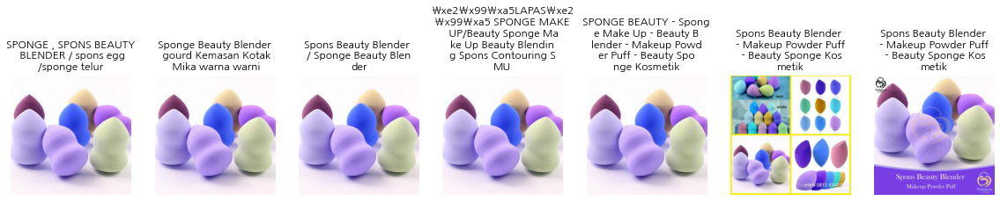

In [85]:
displayIMG(similar_img_df,1,7, train_image_dir, False)

### <index [230, 231, 232] 의 data 추출>

In [90]:
sample_img_idx = match[230].tolist()
train_df.loc[sample_img_idx, :]

,posting_id,image,image_phash,title,label_group
230,train_4000911558,01dd0dba3310703f61d4376ff4e9e017.jpg,e5c79878c6189ae6,100% Cocoa Dark Chocolate Monggo 80g| Cokelat ...,4070348305
231,train_4231036206,01dd0dba3310703f61d4376ff4e9e017.jpg,e5c79878c6189ae6,100% Cocoa Dark Chocolate Monggo 80g| Cokelat ...,4070348305
232,train_3495901022,01dd0dba3310703f61d4376ff4e9e017.jpg,e5c79878c6189ae6,100% Cocoa Dark Unsweetened Chocolate Monggo 8...,4070348305


### <label_group이 4070348305 인 다른 이미지 찾아보기>

In [91]:
similar_img_df = train_df.loc[train_df['label_group']==4070348305, :]
similar_img_df

,posting_id,image,image_phash,title,label_group
230,train_4000911558,01dd0dba3310703f61d4376ff4e9e017.jpg,e5c79878c6189ae6,100% Cocoa Dark Chocolate Monggo 80g| Cokelat ...,4070348305
231,train_4231036206,01dd0dba3310703f61d4376ff4e9e017.jpg,e5c79878c6189ae6,100% Cocoa Dark Chocolate Monggo 80g| Cokelat ...,4070348305
232,train_3495901022,01dd0dba3310703f61d4376ff4e9e017.jpg,e5c79878c6189ae6,100% Cocoa Dark Unsweetened Chocolate Monggo 8...,4070348305
24674,train_2763369083,b8ed64894f94df88d45e26580e89f177.jpg,ed669279c7c2189c,Chocolate Monggo Tablet Dark 100% of Cocoa 80gr,4070348305


### <label_group이 4070348305 인 이미지 확인>

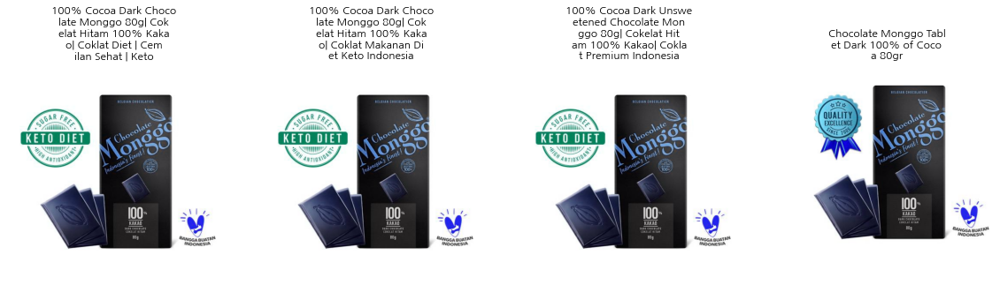

In [92]:
displayIMG(similar_img_df,1,len(similar_img_df), train_image_dir, False)

## Test ==> 5000개 이미지 중 phash 값의 차이가 5 이하인 값 찾기
#### - 이번엔 완전 동일한 이미지는 제외 ( 0 제외)

In [93]:
# 1000개 data에 대한 phash matrix
hash_matches = hash_matrix(train_df['image_phash'].iloc[:5000])

hash_match = []
for i in range(len(hash_matches)):
    hash_match.append(hash_matches.iloc[i, :][(hash_matches.iloc[i, :] > 0) & (hash_matches.iloc[i, :] <= 5)].index.values)
    
hash_match=pd.Series(hash_match)

# 1000개 data 중 동일한 이미지가 3개 이상인 phash data 뽑기
hash_match = hash_match[hash_match.map(lambda x : len(x)>1)]

hash_match

100%|██████████| 5000/5000 [35:41<00:00,  2.33it/s]


167                                    [4214, 4215, 4216]
189                                          [3628, 3629]
548                                          [3259, 4144]
887                              [2629, 3096, 3097, 3167]
1089                                         [4464, 4465]
1308                                           [413, 414]
1496                                         [1056, 1057]
1639    [1651, 1652, 1653, 1654, 1655, 1656, 1657, 165...
1677                                           [588, 589]
1688                                   [2101, 2102, 2103]
1712                                   [1963, 1964, 4274]
1963                                         [1712, 4274]
1964                                         [1712, 4274]
2041                                         [2727, 2728]
2257                                         [2488, 3532]
2416                                         [2325, 2326]
2433                                          [318, 1546]
2488          

### <index 887 이미지와 유사한 phash값 이미지 data 추출>

In [129]:
img_idx = hash_match[887].tolist()
train_df.loc[img_idx, :]

,posting_id,image,image_phash,title,label_group
2629,train_1652717296,141af6598256195cb8f91afe3c5542a8.jpg,bf97c0605a392d17,Tas Selempang Pria Wanita,1237550763
3096,train_219315523,17ce9f90f5c8f3666abc6d6af419fdb5.jpg,bf9f80604a392d97,TAS SELEMPANG PRIA,1237550763
3097,train_4181834509,17ce9f90f5c8f3666abc6d6af419fdb5.jpg,bf9f80604a392d97,Tas Selempang Pria Wanita,1237550763
3167,train_1702727283,184ff5792d109a5296a16abd7925ed7a.jpg,bf9f80604a392d97,WAISTBAG AS - Tas Selempang Pria Wanita,1237550763


In [131]:
# 위 df에서 첫번째와 두번째 상품 이미지 phash값이 다르다
# 둘의 차이를 확인해봤더니 4 이다.
# 5이하의 값이 이미지의 유사성을 보장하는 데 유의미할 수 있다.

test1 = imagehash.hex_to_hash(train_df.iloc[2629,2])
test2 = imagehash.hex_to_hash(train_df.iloc[3096,2])
print(test1 - test2)

4


### <label_group이 1237550763 인 다른 이미지 찾아보기>

In [98]:
similar_img_df = train_df.loc[train_df['label_group']==1237550763, :]
similar_img_df

,posting_id,image,image_phash,title,label_group
887,train_1065906242,0702e39f1340215535647b90b582df0b.jpg,bf9f80605a392d17,NEW WAISTBAG ALA KOREA - Tas Selempang Pria Wa...,1237550763
1562,train_2458596748,0c1da0c6bab51f1fe7df75ef060fc77d.jpg,eadad1350f6c7842,Pushop Waistbag Pria Traveling Waterproof Prof...,1237550763
2629,train_1652717296,141af6598256195cb8f91afe3c5542a8.jpg,bf97c0605a392d17,Tas Selempang Pria Wanita,1237550763
3096,train_219315523,17ce9f90f5c8f3666abc6d6af419fdb5.jpg,bf9f80604a392d97,TAS SELEMPANG PRIA,1237550763
3097,train_4181834509,17ce9f90f5c8f3666abc6d6af419fdb5.jpg,bf9f80604a392d97,Tas Selempang Pria Wanita,1237550763
3167,train_1702727283,184ff5792d109a5296a16abd7925ed7a.jpg,bf9f80604a392d97,WAISTBAG AS - Tas Selempang Pria Wanita,1237550763
6236,train_1298274482,2f397108370676e8ce60a7b4a2f1c435.jpg,bf97c0604a3b2d17,Tas Selempang Waistbag Pria Wanita,1237550763
7062,train_1551895204,3579c69137d4eab8deee20d25988d2a5.jpg,bf9f80604a392d97,WAISTBAG COWOK / TAS PINGGANG PRIA,1237550763
7828,train_1847595366,3b003e0d5f3a77bdb56b3b1c873a1fc5.jpg,bfc6c03a0fe1e087,[LOKAL] DOMMO - D1370 WAISTBAG AS - Tas Selemp...,1237550763
8738,train_468451127,41ac4cca73c8b8cf63b088c89912a52e.jpg,af9f90604b172d9a,TAS WAISTBAG PRIA TAS SELEMPANG ORIGINAL DISTRO,1237550763


### <label_group이 4198148727 인 이미지 확인>

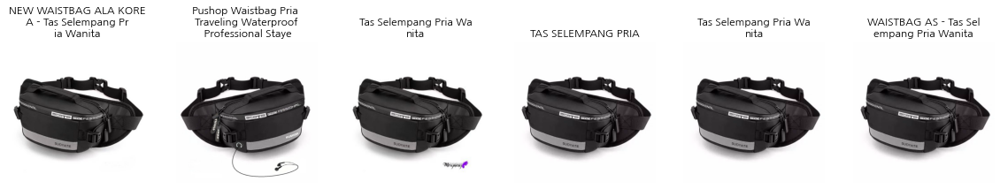

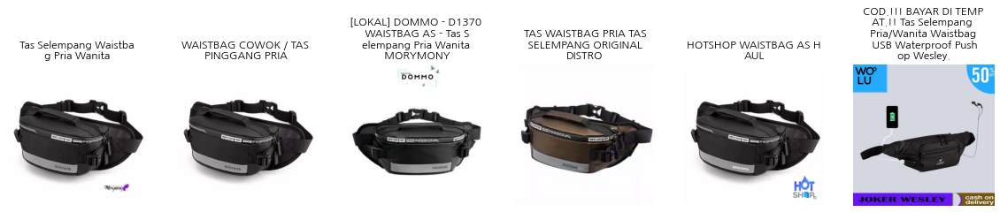

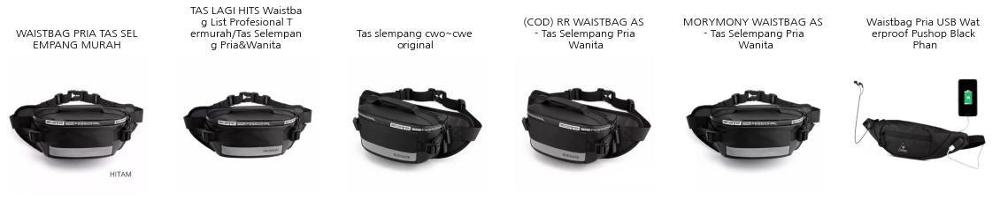

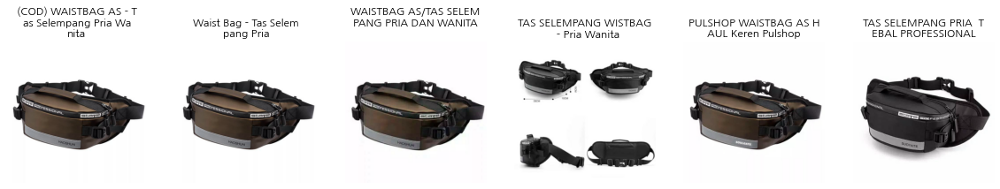

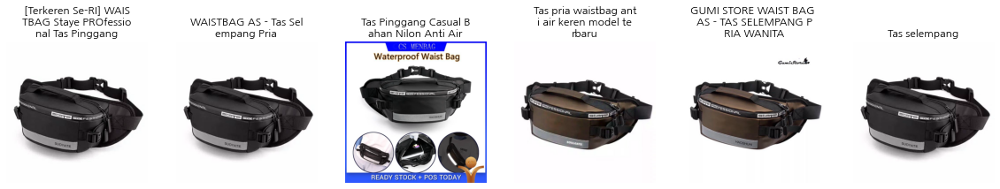

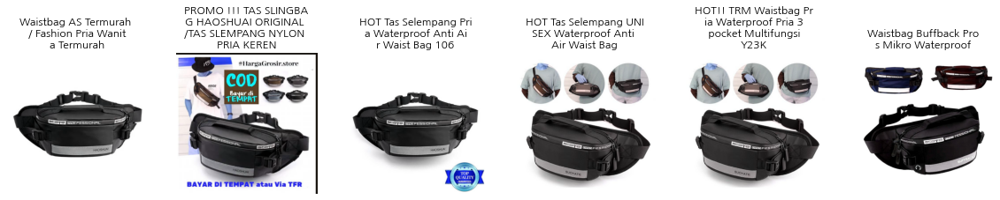

In [100]:
displayIMG(similar_img_df,6,6, train_image_dir, False)

## Test ==> 5000개 이미지 중 phash 값의 차이가 10 이하인 값 찾기

In [124]:
hash_match = []
for i in tqdm(range(len(hash_matches)),
             total=len(hash_matches),
             position=0,
             leave=True):
    hash_match.append(hash_matches.iloc[i, :][(hash_matches.iloc[i, :] > 0) & (hash_matches.iloc[i, :] <= 10)].index.values)
    
hash_match=pd.Series(hash_match)

# 1000개 data 중 동일한 이미지가 3개 이상인 phash data 뽑기
hash_match = hash_match[hash_match.map(lambda x : len(x)>1)]

hash_match

100%|██████████| 5000/5000 [00:36<00:00, 137.11it/s]


8                               [4828, 4829]
16                        [1694, 2114, 4186]
38      [1171, 2022, 2141, 3128, 3592, 4882]
44                   [927, 2497, 2897, 4802]
140                                 [28, 29]
                        ...                 
4802             [44, 927, 2497, 2897, 4998]
4865                            [1518, 1519]
4882      [38, 1171, 3128, 3196, 3291, 4086]
4900                            [3240, 3800]
4998                            [2497, 4802]
Length: 141, dtype: object

### <index 38 이미지와 유사한 phash값 이미지 data 추출>

In [126]:
img_idx = hash_match[38].tolist()
similar_img_df = train_df.loc[img_idx, :]
similar_img_df

,posting_id,image,image_phash,title,label_group
1171,train_90988299,091b888ba5a99238429702cc5d6cbeb9.jpg,e699996499639999,Clean Face Micellar Water 3 in 1 Oily Skin 100 ML,1754005296
2022,train_3096365585,0f9005ddaea286bcb62b7b91fd5c81bf.jpg,e6999b2699663199,Koepoe Koepoe Perisa Vanila 20gr,703153021
2141,train_3942479788,107af60a2f111adfa929dc2b7ee01b14.jpg,e699996699666499,VIVA Air Mawar 100 ml,562358068
3128,train_70223910,18137c53a99bcd81e0b99652f5ab43f4.jpg,e4999964c6649b9b,Whitening Serum for acne,58377970
3592,train_3500331962,1b8d6aabc5d309af846a4c42de6a4023.jpg,e699996699266699,Viva Air Mawar Termurah 100% Original,562358068
4882,train_954707076,24e4f423496db4eb3bfb59d7d2a81699.jpg,e6999966cc66998c,Saniter Fabric Disinfectant Spray 200ml + 30ml,2539384016


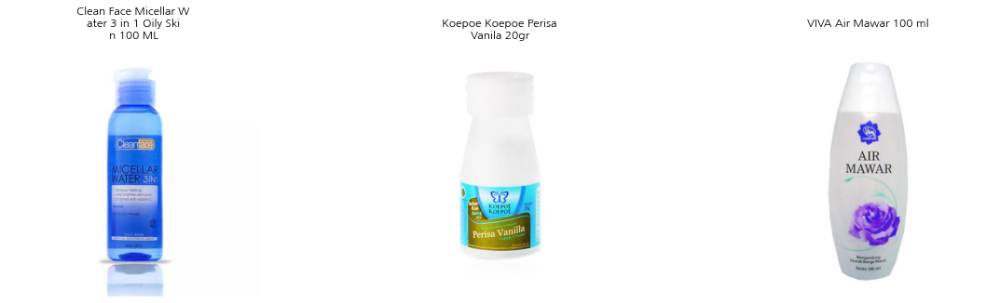

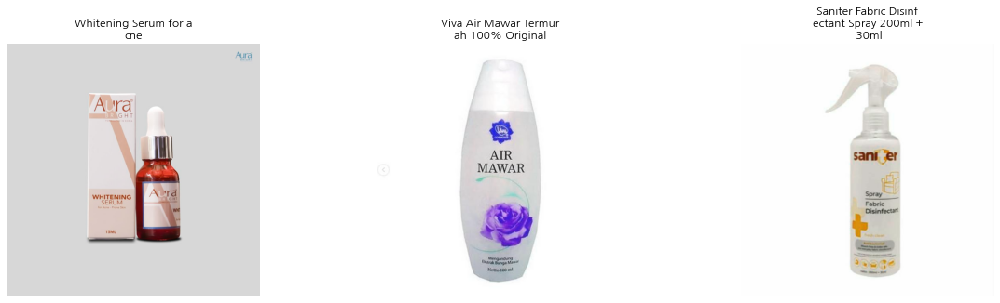

In [128]:
displayIMG(similar_img_df,2,3, train_image_dir, False)

## phash 값 차이가 5 이하인 이미지에서 유사한 이미지를 찾을 가능성이 높은 것을 발견
## phash 값 차이가 10 이하인 이미지에서는 다른 이미지를 같은 상품으로 오인할 여지 있음

## 전체 data ==> phash 차이 값 구하는 함수

In [132]:
def simmilar_hash(df):
    total_hash = df['image_phash'].map(lambda x: imagehash.hex_to_hash(x))
    simmilar_hash_index = []
    for i in tqdm(range(len(df)),
                    total = len(df),
                    position=0,
                    leave= True):
        now_hash = imagehash.hex_to_hash(df['image_phash'][i])
        diff_hash = total_hash - now_hash
        simmilar_hash_index.append(df['image_phash'][(diff_hash >= 0) & (diff_hash<= 5)].index.values)
    simmilar_hash_data = pd.Series(simmilar_hash_index)
    simmilar_hash_data = simmilar_hash_data[simmilar_hash_data.map(lambda x: len(x)>1)]
    return simmilar_hash_data

In [ ]:
diff_hash_data = simmilar_hash(train_df)
diff_hash_data

 79%|███████▉  | 27042/34250 [54:39<14:23,  8.35it/s]  

# #####################################

# Text Data

# #####################################

### <TFIDF Text 처리>

In [8]:
text_model = TfidfVectorizer(stop_words='english', binary=True, max_features=25000)
text_embeddings = text_model.fit_transform(train_df['title']).toarray()
text_embeddings.shape

(34250, 24939)

### <KNN 적용>

In [ ]:
knn=3
model = NearestNeighbors(n_neighbors=knn)
model.fit(text_embeddings)

distance, index_num = model.kneighbors(text_embeddings)

### <가장 근접한 2개의 이웃 data의 거리와 그 data가 동일상품인지 label_group 확인>

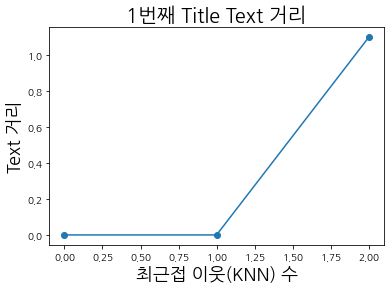

                           title       image_phash  label_group
0      Paper Bag Victoria Secret  94974f937d4c2433    249114794
33161  PAPER BAG VICTORIA SECRET  ac63931c3d4b42f6    249114794
9219     PAPER BAG THE BODY SHOP  ca078c9893b3dae3    471581622


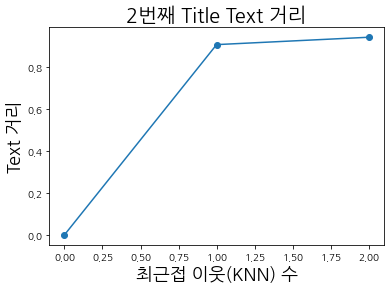

                                                   title       image_phash  \
1      Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...  af3f9460c2838f0f   
18683  Double Tape VHB 3M ORIGINAL 12mm x 4.5mm Busa ...  bfc6d01bc72c1d30   
23593  Double Tape 3M 4900 VHB 24 mm x 4.5m tebal 1.1...  d5c42af8fc837170   

       label_group  
1       2937985045  
18683   2937985045  
23593   2819310070  


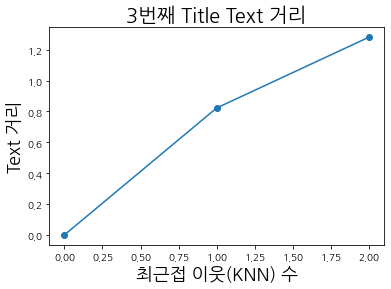

                                             title       image_phash  \
2      Maling TTS Canned Pork Luncheon Meat 397 gr  b94cb00ed3e50f78   
15668      Maling Ham Pork Luncheon Meat TTS 397gr  eb969469cd384ac6   
6353              MEAT GRINDER / PENGGILING DAGING  ad0ff4963b61cc28   

       label_group  
2       2395904891  
15668   2395904891  
6353    3760480756  


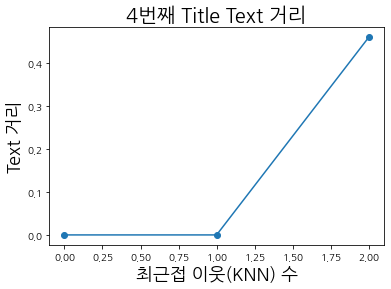

                                                   title       image_phash  \
3      Daster Batik Lengan pendek - Motif Acak / Camp...  8514fc58eafea283   
28878  Daster Batik Lengan pendek - Motif Acak / Camp...  abc28c0dd1a4d37e   
32290  Daster Batik Lengan pendek - Motif Acak / Camp...  8fcbe274de88a462   

       label_group  
3       4093212188  
28878   3150867956  
32290   2453599242  


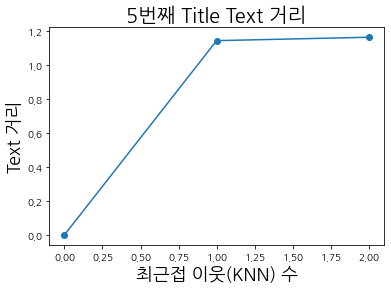

                                   title       image_phash  label_group
4      Nescafe \xc3\x89clair Latte 220ml  a6f319f924ad708c   3648931069
18449    Nescafe Eclair Latte Pet 220 Ml  e69999663199cc93   3648931069
252                      Nescafe classic  bce5c11a96393cc6   3030935442


In [18]:
for i in range(5):
    plt.figure()
    plt.plot(np.arange(knn), distance[i], 'o-')
    plt.rc('font', family='NanumGothic')
    plt.title('{}번째 Title Text 거리'.format(i+1), size=20)
    plt.ylabel('Text 거리', size=18)
    plt.xlabel('최근접 이웃(KNN) 수', size=18)
    plt.show()
    
    print(train_df.loc[index_num[i,:3], ['title', 'label_group']])

### <Title Text 전처리 함수>

In [12]:
# title 단어 preprocessing
def text_preprocessing(text, flg_stem, flg_lemm):
    
    stopwords_list = nltk.corpus.stopwords.words('english')
    
    # 특수기호 제거, 모든 문자 소문자, 양옆 공백 제거
    text = re.sub(r'[^\w\s]', '', str(text).lower().strip())
    
    # text 문자에서 stopwords_list 에 있는 단어 제거하기
    text_list = text.split()
    
    if stopwords_list is not None :
        text_list = [word for word in text_list 
                    if word not in text_list]
        
    # -ing, -ly, ... 같은 접미어 제거 하기 (가지치기)
    if flg_stem == True :
        ps = nltk.stem.porter.PorterStemmer()
        text_list = [ps.stem(word) for word in text_list]
        
    # 뿌리 단어로 바꾸기
    if flg_lemm == True:
        lem = nltk.stem.wordnet.WordNetLemmatizer()
        text_list = [lem.lemmatize(word) for worf in text_list]
        
    # 문자열로 되돌려놓기
    clean_text = " ".join(text_list)
    return text

#### stopwords 가 무엇이길래 제거하는걸까?

In [10]:
stopwords_list = nltk.corpus.stopwords.words('english')
stopwords_list

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

### <Clean_Title 관련 data 생성>

In [26]:
# Title preprocessing
train_df['clean_title'] = train_df['title'].map(lambda x : text_preprocessing(x, True, True))

# Clean_title 글자 개수(띄어쓰기 포함)
train_df['clean_title_len'] = train_df['clean_title'].map(lambda x: len(x))

# Clean_title 단어 개수
train_df['clean_title_word_count'] = train_df['clean_title'].map(lambda x: len(str(x).split(" ")))

# Clean_title 철자(스펠링) 개수(띄어쓰기 제외)
train_df['clean_title_char_count'] = train_df['clean_title'].map(lambda x: sum(len(word) for word in str(x).split(" ")))

# Clean_title 단어 대비 글자 개수
train_df['clean_title_avg_word_length'] = train_df['clean_title_char_count'] / train_df['clean_title_word_count']

train_df.iloc[:10,3:]


,title,label_group,clean_title,clean_title_len,clean_title_word_count,clean_title_char_count,clean_title_avg_word_length
0,Paper Bag Victoria Secret,249114794,paper bag victoria secret,25,4,22,5.500000
1,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045,double tape 3m vhb 12 mm x 45 m original doub...,58,14,45,3.214286
2,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891,maling tts canned pork luncheon meat 397 gr,43,8,36,4.500000
3,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188,daster batik lengan pendek motif acak campur...,92,16,77,4.812500
4,Nescafe \xc3\x89clair Latte 220ml,3648931069,nescafe xc3x89clair latte 220ml,31,4,28,7.000000
5,CELANA WANITA (BB 45-84 KG)Harem wanita (bisa...,2660605217,celana wanita bb 4584 kgharem wanita bisa cod,46,9,38,4.222222
6,Jubah anak size 1-12 thn,1835033137,jubah anak size 112 thn,23,5,19,3.800000
7,KULOT PLISKET SALUR /CANDY PLISKET /WISH KULOT...,1565741687,kulot plisket salur candy plisket wish kulot p...,85,12,74,6.166667
8,"[LOGU] Tempelan kulkas magnet angka, tempelan ...",2359912463,logu tempelan kulkas magnet angka tempelan ang...,55,8,48,6.000000
9,BIG SALE SEPATU PANTOFEL KULIT KEREN KERJA KAN...,2630990665,big sale sepatu pantofel kulit keren kerja kan...,98,16,83,5.187500


### <각 Data histogram 확인>

In [37]:
fig = px.histogram(train_df, 
                   x='clean_title_len',
                   title='Clean Title Distribution')
fig.show()

In [32]:
fig = px.histogram(train_df, 
                   x='clean_title_word_count',
                   title='Clean Title Word Distribution')
fig.show()

In [38]:
fig = px.histogram(train_df, 
                   x='clean_title_char_count',
                   title='Clean Title Caracter Distribution')
fig.show()

In [39]:
fig = px.histogram(train_df, 
                   x='clean_title_avg_word_length',
                   title='Clean Title Average Word Length Distribution')
fig.show()

### <전처리 된 Clean Title Text로 KNN 적용>

In [40]:
preprocess_text_model = TfidfVectorizer(stop_words='english', binary=True, max_features=25000)
preprocess_text_embeddings = preprocess_text_model.fit_transform(train_df['clean_title']).toarray()
preprocess_text_embeddings.shape

(34250, 25000)

In [ ]:
knn=10
model = NearestNeighbors(n_neighbors=knn)
model.fit(preprocess_text_embeddings)

distance, index_num = model.kneighbors(preprocess_text_embeddings)

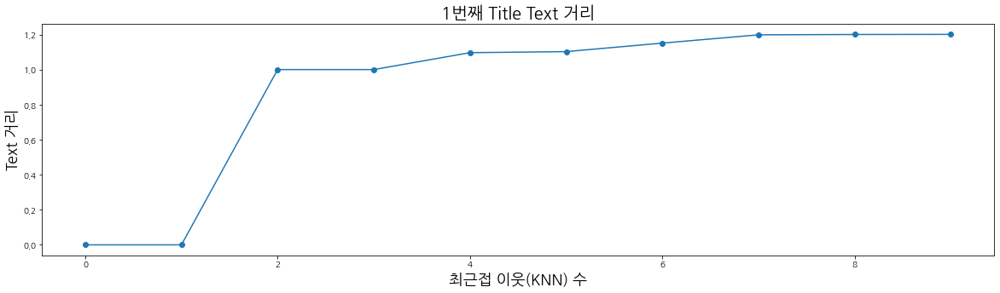

                                                   title  \
33161                          PAPER BAG VICTORIA SECRET   
0                              Paper Bag Victoria Secret   
14695                                              Mpek"   
9517                                     MORENO DRANATHA   
25386  READY! GRATIS ISI ULANG! Pengharum parfum mobi...   
9219                             PAPER BAG THE BODY SHOP   
31159                      Paper Bag The Body Shop Small   
2676           Paper Bag Tas Kertas Polos Ukuran 18x5x22   
30518                           VELROSE SECRET FACE MASK   
4156   Dengan Paper Bag TABITA EXCLUSIVE ORIGINAL KEM...   

                                             clean_title  label_group  
33161                          paper bag victoria secret    249114794  
0                              paper bag victoria secret    249114794  
14695                                               mpek   2813625930  
9517                                     moreno dra

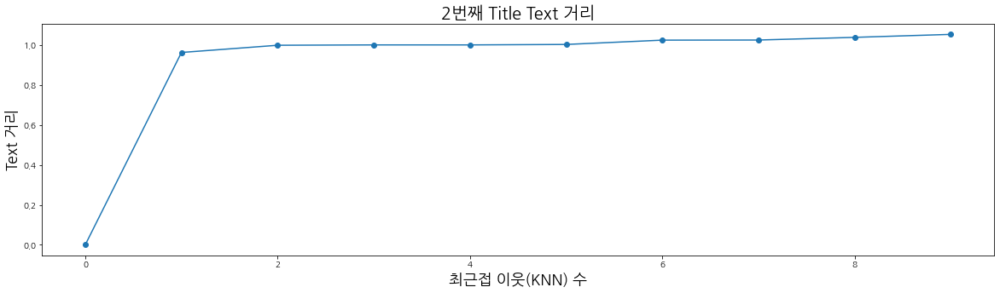

                                                   title  \
1      Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...   
18683  Double Tape VHB 3M ORIGINAL 12mm x 4.5mm Busa ...   
23593  Double Tape 3M 4900 VHB 24 mm x 4.5m tebal 1.1...   
14695                                              Mpek"   
9517                                     MORENO DRANATHA   
25199  3M VHB 12mm x 4.5m Double Tape Foam Merah Otom...   
194    3M VHB Double Tape Automotive 4900 tebal 1.1 m...   
469    3M VHB Double Tape Automotive 4900 tebal 1.1 m...   
4774   3M 1600 T Double Tape PE Foam tebal: 1.0 mm, s...   
21790  DOUBLE TAPE BUSA 3M Pe Foam Tape 24mm x 4M ORI...   

                                             clean_title  label_group  
1      double tape 3m vhb 12 mm x 45 m original  doub...   2937985045  
18683  double tape vhb 3m original 12mm x 45mm busa p...   2937985045  
23593  double tape 3m 4900 vhb 24 mm x 45m tebal 11 m...   2819310070  
14695                                              

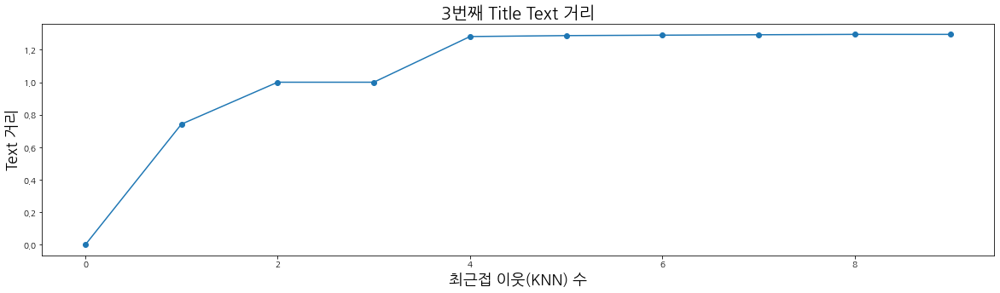

                                                   title  \
2            Maling TTS Canned Pork Luncheon Meat 397 gr   
15668            Maling Ham Pork Luncheon Meat TTS 397gr   
14695                                              Mpek"   
9517                                     MORENO DRANATHA   
6353                    MEAT GRINDER / PENGGILING DAGING   
25580                        Samcan babi atau Pork Belly   
205                               M031 Alarm anti maling   
5294   Life Cat Pounch 85gr Makanan Basah Kucing No Pork   
17339  Gembok Alarm Ring Panjang / Gembok anti maling...   
22085     Gembok Alarm Ring Panjang / Gembok Anti Maling   

                                             clean_title  label_group  
2            maling tts canned pork luncheon meat 397 gr   2395904891  
15668            maling ham pork luncheon meat tts 397gr   2395904891  
14695                                               mpek   2813625930  
9517                                     moreno dra

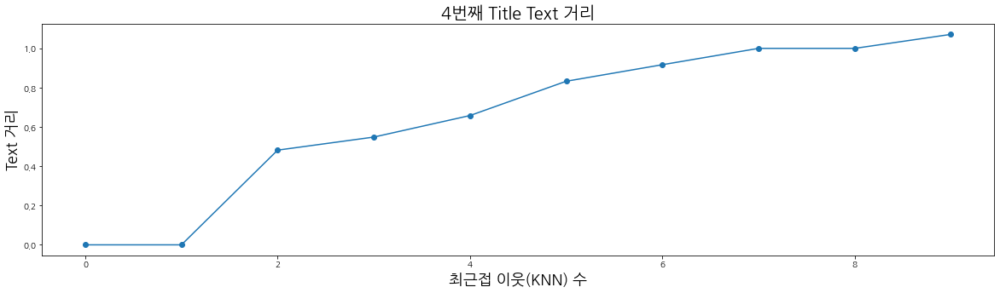

                                                   title  \
3      Daster Batik Lengan pendek - Motif Acak / Camp...   
28878  Daster Batik Lengan pendek - Motif Acak / Camp...   
32290  Daster Batik Lengan pendek - Motif Acak / Camp...   
2522   Daster Batik Lengan pendek - Motif Acak / Camp...   
20105  Daster Batik Bali Lengan pendek - Motif Acak /...   
22183  Daster Payung Bali JUMBO XXL, Motif Acak / Cam...   
27812  Daster Karakter - Leher Kancing (DPT001-00) Bu...   
14695                                              Mpek"   
9517                                     MORENO DRANATHA   
27637  Daster payung klok motif acak/campur leher kan...   

                                             clean_title  label_group  
3      daster batik lengan pendek  motif acak  campur...   4093212188  
28878  daster batik lengan pendek  motif acak  campur...   3150867956  
32290  daster batik lengan pendek  motif acak  campur...   2453599242  
2522   daster batik lengan pendek  motif acak  camp

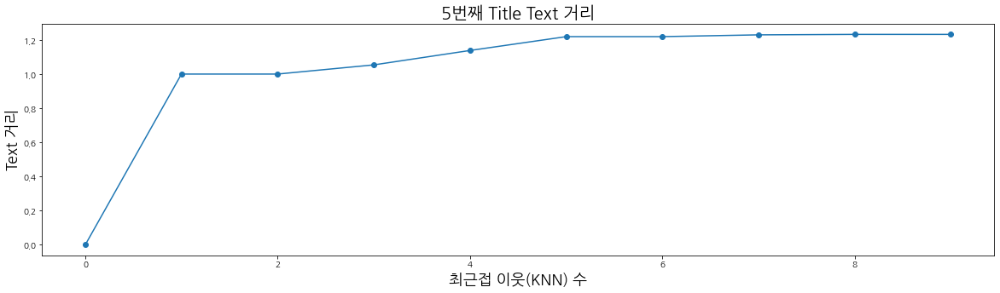

                                   title                        clean_title  \
4      Nescafe \xc3\x89clair Latte 220ml    nescafe xc3x89clair latte 220ml   
9517                     MORENO DRANATHA                    moreno dranatha   
14695                              Mpek"                               mpek   
18449    Nescafe Eclair Latte Pet 220 Ml    nescafe eclair latte pet 220 ml   
252                      Nescafe classic                    nescafe classic   
11352              Torabika creamy latte              torabika creamy latte   
3863               Torabika Creamy Latte              torabika creamy latte   
2900            Kopi Nescafe Classic 2gr           kopi nescafe classic 2gr   
8890   Refill Kopi Nescafe Classic 100gr  refill kopi nescafe classic 100gr   
9438   Refill Kopi Nescafe Classic 100gr  refill kopi nescafe classic 100gr   

       label_group  
4       3648931069  
9517    4187918248  
14695   2813625930  
18449   3648931069  
252     3030935442  
1135

In [43]:
for i in range(5):
    plt.figure(figsize=(20,5))
    plt.plot(np.arange(knn), distance[i], 'o-')
    plt.rc('font', family='NanumGothic')
    plt.title('{}번째 Clean Title Text 거리'.format(i+1), size=20)
    plt.ylabel('Text 거리', size=18)
    plt.xlabel('최근접 이웃(KNN)', size=18)
    plt.show()
    
    print(train_df.loc[index_num[i,:knn], ['title', 'clean_title', 'label_group']])

# <Title Text EDA 중간 Feedback>
## - Title Text Data 처리에서 KNN model로는 동일 상품 1개정도만 분별할 수 있는 한계 존재 (데이터 전처리를 하더라도)
## - 더 많은 동일 상품을 찾아낼 수 있는 알고리즘 접근 필요해 보임